# Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import os

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer

# metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

import warnings
warnings.filterwarnings('ignore')



# saving model
import joblib

In [2]:
!wget https://raw.githubusercontent.com/ezzaddeentru/used-cars-selling-price-estimating---case-study/main/reg_helper_functions.py
!wget https://raw.githubusercontent.com/ezzaddeentru/recipe-popularity-prediction/main/helper_functions.py

--2024-08-24 13:23:04--  https://raw.githubusercontent.com/ezzaddeentru/used-cars-selling-price-estimating---case-study/main/reg_helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19287 (19K) [text/plain]
Saving to: ‘reg_helper_functions.py’

reg_helper_function 100%[===================>]  18.83K  --.-KB/s    in 0.001s  

2024-08-24 13:23:04 (36.2 MB/s) - ‘reg_helper_functions.py’ saved [19287/19287]

--2024-08-24 13:23:04--  https://raw.githubusercontent.com/ezzaddeentru/recipe-popularity-prediction/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connec

In [3]:
from reg_helper_functions import *
from reg_helper_functions import regression_metrics_df, calculate_cv_metrics_regression, combine_and_format_metrics
from reg_helper_functions import plot_regression_models_metrics, plot_residuals, plot_residuals_sns
from reg_helper_functions import plot_learning_curves_reg, plot_regression_metrics

from helper_functions import *
from helper_functions import plot_numerical_feature_comparison, plot_feature_distributions
from helper_functions import plot_category_distribution, plot_category_distribution_by_group

# Objective
Use time-series forecasting to **forecast store sales** on data from Corporación Favorita, a large Ecuadorian-based grocery retailer.

Specifically, you'll build a model that more accurately **predicts the unit sales for thousands of items sold at different Favorita stores.** You'll practice your machine learning skills with an approachable training dataset of dates, store, and item information, promotions, and unit sales.

# Data from kaggle

In [4]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'store-sales-time-series-forecasting:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F29781%2F2887556%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240823%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240823T220111Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D71287a570fc3556640b732ff1ecdbdb3534e2a394dcc6e4694094c58bc4429a1e9cf65eeb6e2b038ab467f239fe037a34325f6709f9cc2d0a6b4e41f8b293be25c5589e8afe179b83660d19bf031a7d0bc5559c860f4e991b19a0f83da2ad3b3e88e84b0e911e6d0746252b49219e77432767990046d57f89cbe3ab8b159baa58fe6bde3af6e8bab8e47beae914f37eba490d7bedb9c15739e2cbb3f95b7b5890cde20694d425b3a52bdd7d204ca4ddbb3ebbb8af467117e814e2cef7bd8034427cc57d8fe2ffcfee9ed212a5cfe2c6b37011e27db2790d3d113fd753f70b855c8470fbd796a69d8a236619bc271179790306388e3847051baa03fbb542d095f'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 22416355 bytes downloaded
Downloaded and uncompressed: store-sales-time-series-forecasting
Data source import complete.


In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/store-sales-time-series-forecasting/transactions.csv
/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv


# Data
**Additional Notes**
- Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.
- A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

In [6]:
train = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/train.csv')
test = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/test.csv')
stores = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/stores.csv')
oil  = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/oil.csv')
holidays_events = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv')
transactions = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/transactions.csv')
sample_submission = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv')

In [ ]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [ ]:
test.head(2)

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB


In [ ]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [ ]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [ ]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [ ]:
holidays_events.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [ ]:
holidays_events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [ ]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


# Data Validation

In [7]:
train['date'] = pd.to_datetime(train['date'])

In [8]:
train.duplicated().sum()

0

No duplicates on the train data

In [ ]:
train.isnull().sum()

,0
id,0
date,0
store_nbr,0
family,0
sales,0
onpromotion,0


No missing values

# EDA

Data have so much data points, to help process and explore the data faster, we will take a 10% sample of it

In [ ]:
3000888 * .1

300088.8

In [ ]:
train_10_sample = train.sample(frac=0.1, random_state=42)

## Distribution of Sales

In [ ]:
train['sales'].describe()

,sales
count,3.000888e+06
mean,3.577757e+02
std,1.101998e+03
min,0.000000e+00
25%,0.000000e+00
50%,1.100000e+01
75%,1.958473e+02
max,1.247170e+05


In [ ]:
total_rows = len(train)

count_below_threshold = len(train[train['sales'] < 5507.0])
count_above_threshold = len(train[train['sales'] > 5507.0])

percent_below_threshold = (count_below_threshold / total_rows) * 100
percent_above_threshold = (count_above_threshold / total_rows) * 100

print(f"Count of sales below 5507.0: {count_below_threshold} ({percent_below_threshold:.2f}%)")
print(f"Count of sales above 5507.0: {count_above_threshold} ({percent_above_threshold:.2f}%)")


Count of sales below 5507.0: 2970869 (99.00%)
Count of sales above 5507.0: 30008 (1.00%)


In [ ]:
train['sales'].quantile(0.99)

5507.0

- 99% of the sales values in train data are below or equal to 5507.0. In other words, only 1% of the sales values exceed 5507.0 - **these could be outliers or represent important high-sales events.**

In [ ]:
train_sales_below_99p = train[train['sales'] < 5507.0]

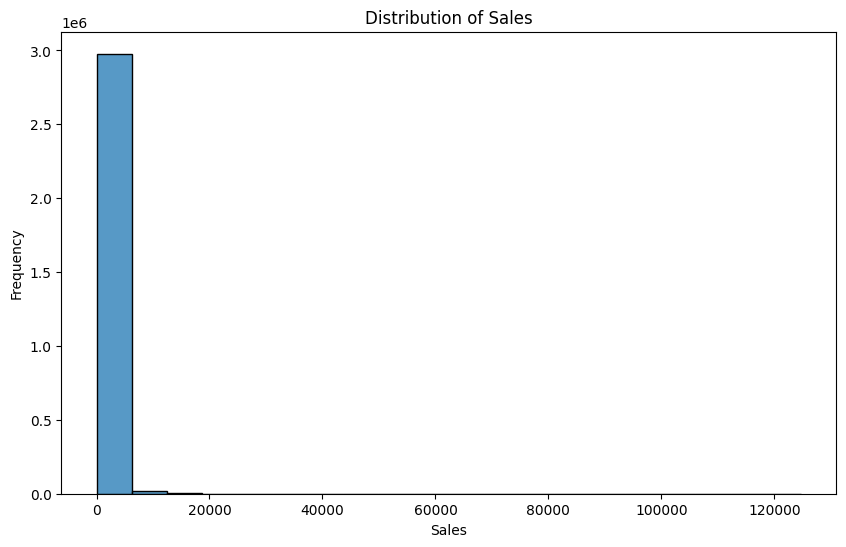

In [ ]:
# Distribution of Sales
plt.figure(figsize=(10, 6))
sns.histplot(train['sales'], bins=20)
plt.title('Distribution of Sales')
plt.xlabel('Sales')
plt.ylabel('Frequency')
plt.show()

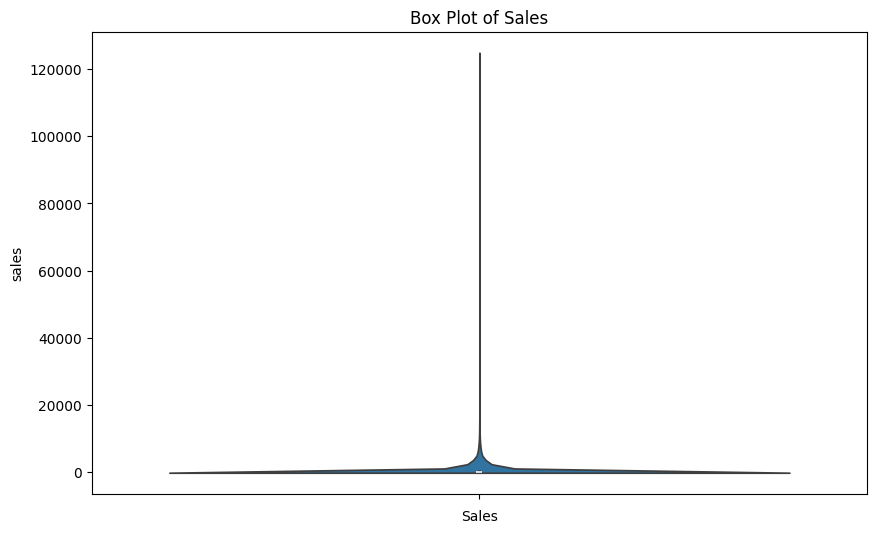

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(train['sales'])
plt.title('Box Plot of Sales')
plt.xlabel('Sales')
plt.show()


There are many outliers in the train data

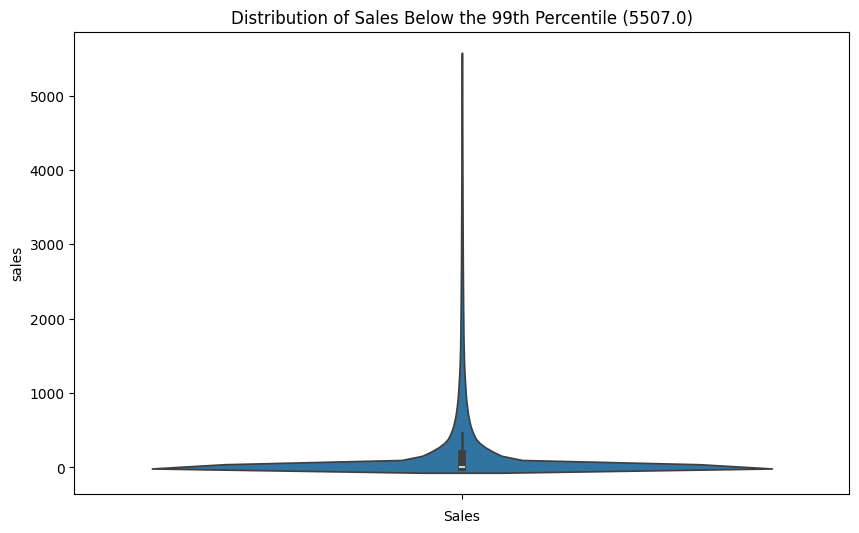

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(train_sales_below_99p['sales'])
plt.title('Distribution of Sales Below the 99th Percentile (5507.0)')
plt.xlabel('Sales')
plt.show()

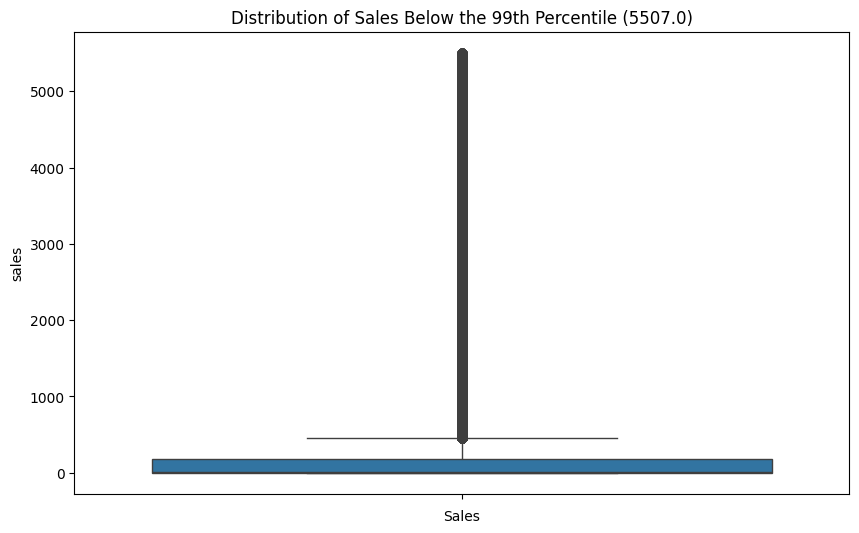

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(train_sales_below_99p['sales'])
plt.title('Distribution of Sales Below the 99th Percentile (5507.0)')
plt.xlabel('Sales')
plt.show()

## Sales Over Time

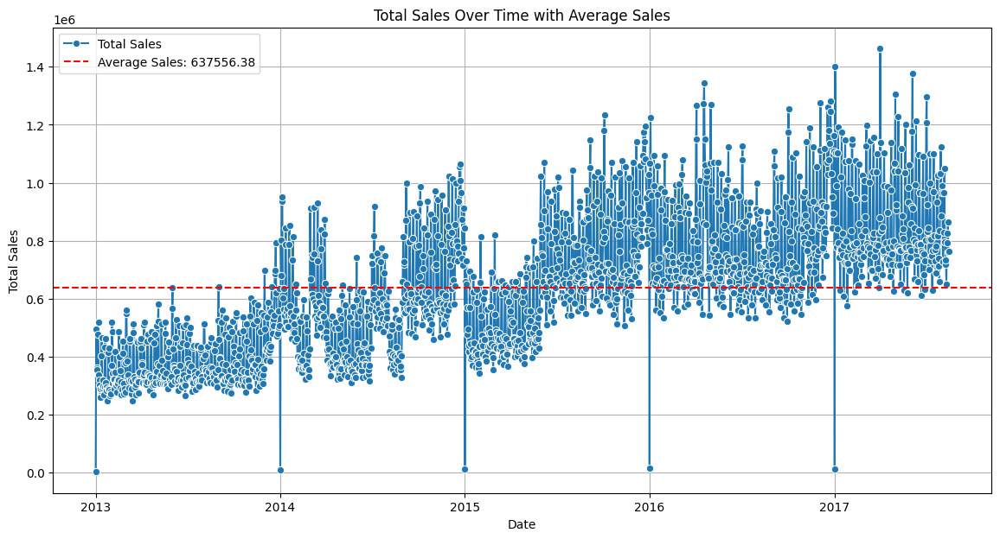

In [ ]:
# Sales Over Time
plt.figure(figsize=(14, 7))

# Calculate total sales per date
sales_per_date = train.groupby('date')['sales'].sum().reset_index()

# Calculate average sales
average_sales = sales_per_date['sales'].mean()

# Plot total sales over time
sns.lineplot(x='date', y='sales', data=sales_per_date, marker='o', label='Total Sales')

# Plot average sales as a horizontal line
plt.axhline(average_sales, color='red', linestyle='--', label=f'Average Sales: {average_sales:.2f}')

plt.title('Total Sales Over Time with Average Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.grid(True)
plt.legend()
plt.show()


## Sales by Product Family

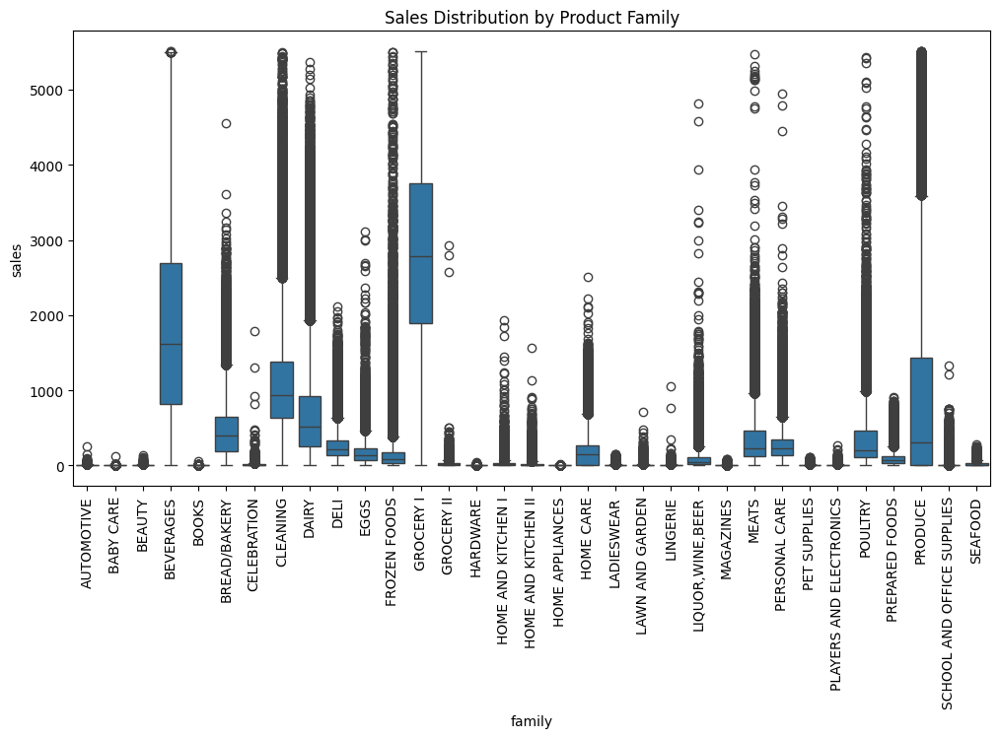

In [ ]:
# Sales by Product Family
plt.figure(figsize=(12, 6))
sns.boxplot(x='family', y='sales', data=train_sales_below_99p)
plt.title('Sales Distribution by Product Family')
plt.xticks(rotation=90)
plt.show()

## Sales by Store Number

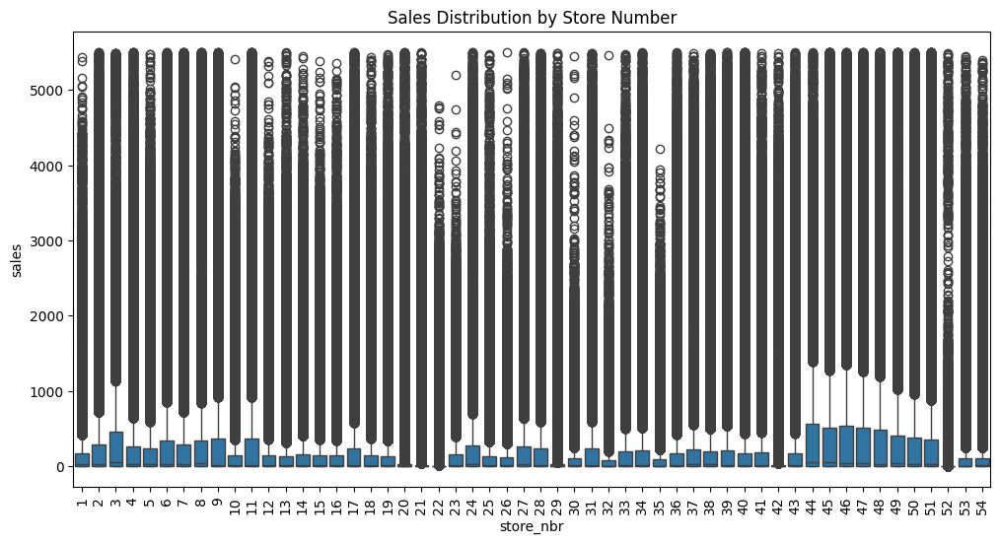

In [ ]:
# Sales by Store Number
plt.figure(figsize=(12, 6))
sns.boxplot(x='store_nbr', y='sales', data=train_sales_below_99p)
plt.title('Sales Distribution by Store Number')
plt.xticks(rotation=90)
plt.show()

## Correlation Matrix

In [ ]:
num_train = train.select_dtypes(include=['integer', 'float64']).drop('id', axis=1)

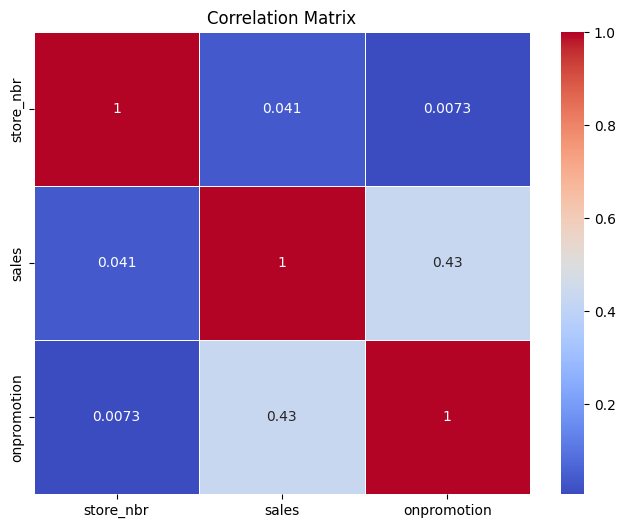

In [ ]:
# Correlation Matrix
plt.figure(figsize=(8, 6))
corr_matrix = num_train.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

- The `store_nbr` has a minimal effect on sales
- `sales and onpromotion` are **positively correlated**, suggesting that promotions have a moderate impact on sales.

## Sales vs. Number of Promotions

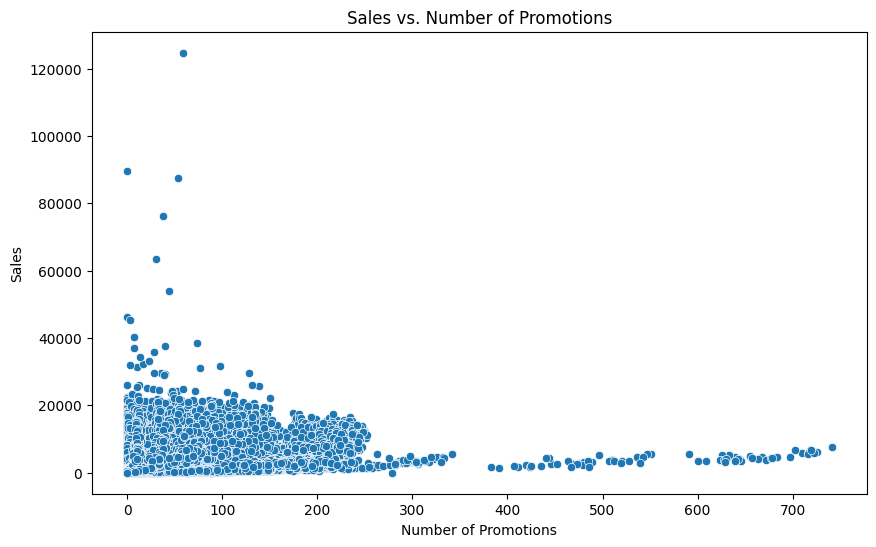

In [ ]:
# Sales vs. Number of Promotions
plt.figure(figsize=(10, 6))
sns.scatterplot(x='onpromotion', y='sales', data=train)
plt.title('Sales vs. Number of Promotions')
plt.xlabel('Number of Promotions')
plt.ylabel('Sales')
plt.show()

# Prepare Data

In [9]:
train_df = train.copy()
train_df = train_df.drop('id', axis=1)
train_df = train_df[train_df['sales'] < train_df.sales.quantile(0.99)]
train_df.shape

(2970869, 5)

In [10]:
X = train_df.drop('sales', axis=1)
y = train_df['sales']

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline([
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', num_pipeline, make_column_selector(dtype_include=['int64', 'float64'])),
    ('cat', cat_pipeline, make_column_selector(dtype_include='object'))
])

X_prepared = preprocessor.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_prepared, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2376695, 35), (594174, 35), (2376695,), (594174,))

In [ ]:
X_train_df = pd.DataFrame(X_train.toarray(), columns=preprocessor.get_feature_names_out())
X_train_df.head(2)

,num__store_nbr,num__onpromotion,cat__family_AUTOMOTIVE,cat__family_BABY CARE,cat__family_BEAUTY,cat__family_BEVERAGES,cat__family_BOOKS,cat__family_BREAD/BAKERY,cat__family_CELEBRATION,cat__family_CLEANING,...,cat__family_MAGAZINES,cat__family_MEATS,cat__family_PERSONAL CARE,cat__family_PET SUPPLIES,cat__family_PLAYERS AND ELECTRONICS,cat__family_POULTRY,cat__family_PREPARED FOODS,cat__family_PRODUCE,cat__family_SCHOOL AND OFFICE SUPPLIES,cat__family_SEAFOOD
0,-1.571926,0.253800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.644715,0.160459,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Linear Regression
let's practice Time-step and Lag features with Linear Regression

## Time-step features


> There are two kinds of features unique to time series: time-step features and lag features.
- **Time-step features** are features we can derive directly from the time index. The most basic time-step feature is the time dummy, which counts off time steps in the series from beginning to end. Time-step features let you model **time dependence**. A series is time dependent if its values can be predicted from the time they occured.
- To make a **lag feature** we shift the observations of the target series so that they appear to have occured later in time. More generally, lag features let you model **serial dependence**. A time series has serial dependence when an observation can be predicted from previous observations. In Hardcover Sales, we can predict that high sales on one day usually mean high sales the next day.

[Source](https://www.kaggle.com/code/ryanholbrook/linear-regression-with-time-series)

Let's see how the linear reg model performs with time-step features

In [14]:
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date['Time'] = np.arange(len(sales_per_date.index))
sales_per_date.head(2)

,date,sales,Time
0,2013-01-01,2511.618999,0
1,2013-01-02,401213.417944,1


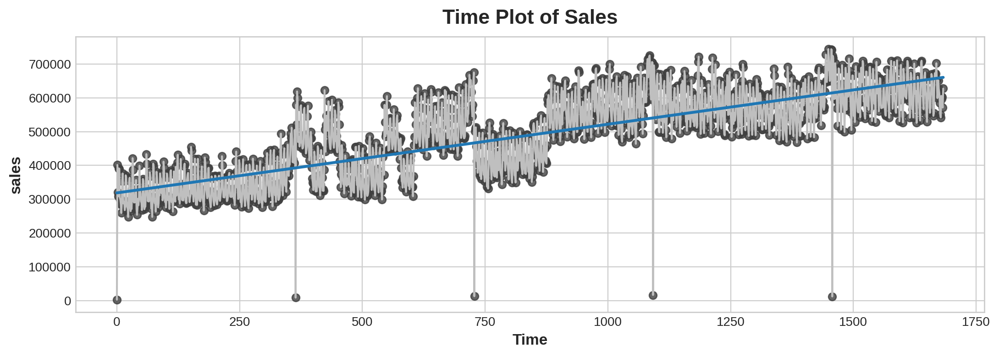

In [ ]:
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)

%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()
ax.plot('Time', 'sales', data=sales_per_date, color='0.75')
ax = sns.regplot(x='Time', y='sales', data=sales_per_date, ci=None, scatter_kws=dict(color='0.25'))
ax.set_title('Time Plot of Sales');

## Lag features
let's create a 1-step lag feature.
Shifting by multiple steps is possible too.

In [ ]:
sales_per_date['sales_lag1'] = sales_per_date['sales'].shift(1)
sales_per_date.head(2)

,date,sales,Time,sales_lag1
0,2013-01-01,2511.618999,0,NaN
1,2013-01-02,401213.417944,1,2511.618999


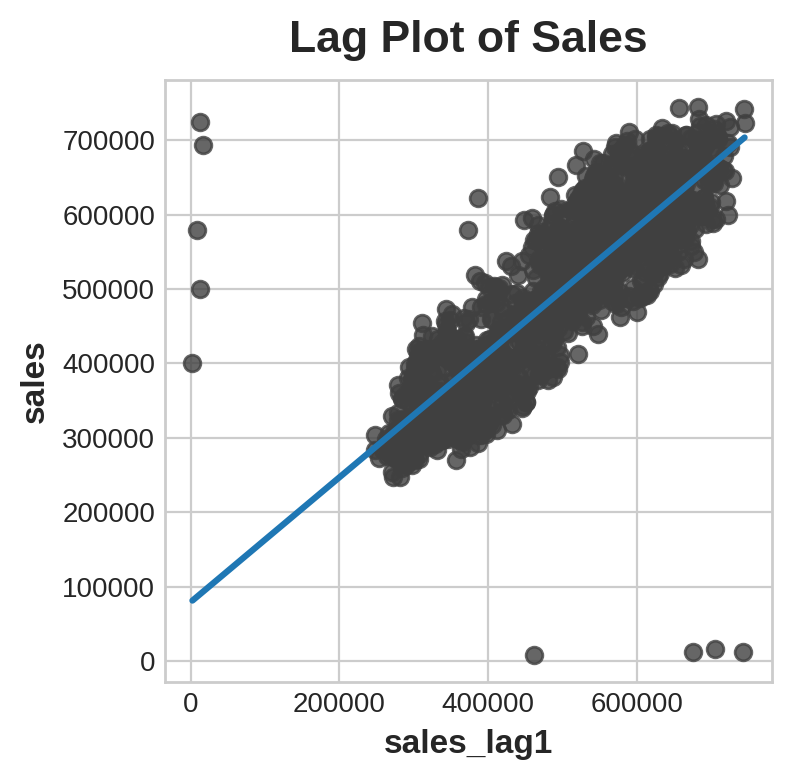

In [ ]:
fig, ax = plt.subplots()
ax = sns.regplot(x='sales_lag1', y='sales', data=sales_per_date, ci=None, scatter_kws=dict(color='0.25'))
ax.set_aspect('equal')
ax.set_title('Lag Plot of Sales');

We can see from the lag plot that sales on one day are correlated with sales from the previous day (sales_lag1). When we see a relationship like this, we know a lag feature will be useful.

## Model

In [ ]:
sales_per_date = sales_per_date.set_index('date')
sales_per_date.head(2)

,sales,Time,sales_lag1
date,,,
2013-01-01,2511.618999,0,NaN
2013-01-02,401213.417944,1,2511.618999


In [ ]:
from sklearn.linear_model import LinearRegression

# Training data
X = sales_per_date.loc[:, ['Time']]  # features
y = sales_per_date.loc[:, 'sales']  # target

lin_reg = LinearRegression()
lin_reg.fit(X, y)

LinearRegression()

In [ ]:
y_pred = pd.Series(lin_reg.predict(X), index=X.index)

In [ ]:
lin_reg.coef_, lin_reg.intercept_

(array([203.12584666]), 318689.0272374117)

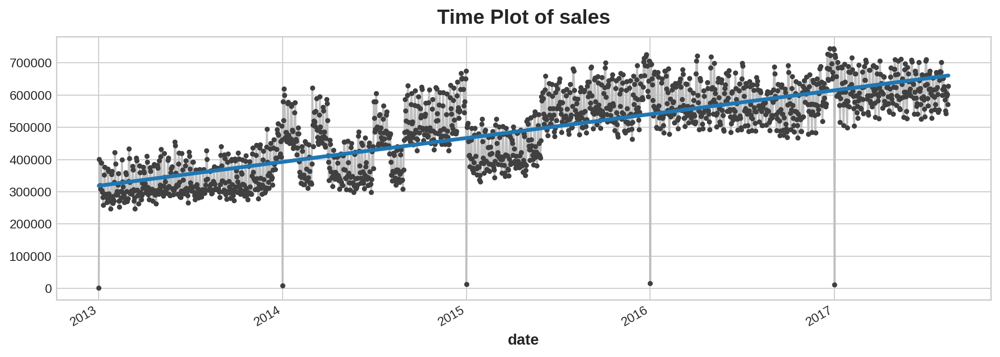

In [ ]:
ax = y.plot(**plot_params)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of sales');

In [ ]:
lin_metrics_time = regression_metrics_df(y, y_pred, y, y_pred, 'LinearRegression - time step features')
lin_metrics_time

,Metric,Train Set,Test Set,Model
0,RMSE,74935.92,74935.92,LinearRegression - time step features
1,MAPE (%),29.50,29.50,LinearRegression - time step features
2,R2 Score,0.63,0.63,LinearRegression - time step features
3,MAE,58993.05,58993.05,LinearRegression - time step features
4,Relative Error to Mean (%),15.30,15.30,LinearRegression - time step features


In [ ]:
plot_residuals(y, y_pred, 'Residuals of LinearRegression - time step features')

In [ ]:
X = sales_per_date.loc[:, ['sales_lag1']]
X.dropna(inplace=True)  # drop missing values in the feature set
y = sales_per_date.loc[:, 'sales']  # target
y, X = y.align(X, join='inner')  # drop corresponding values in target

model = LinearRegression()
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)

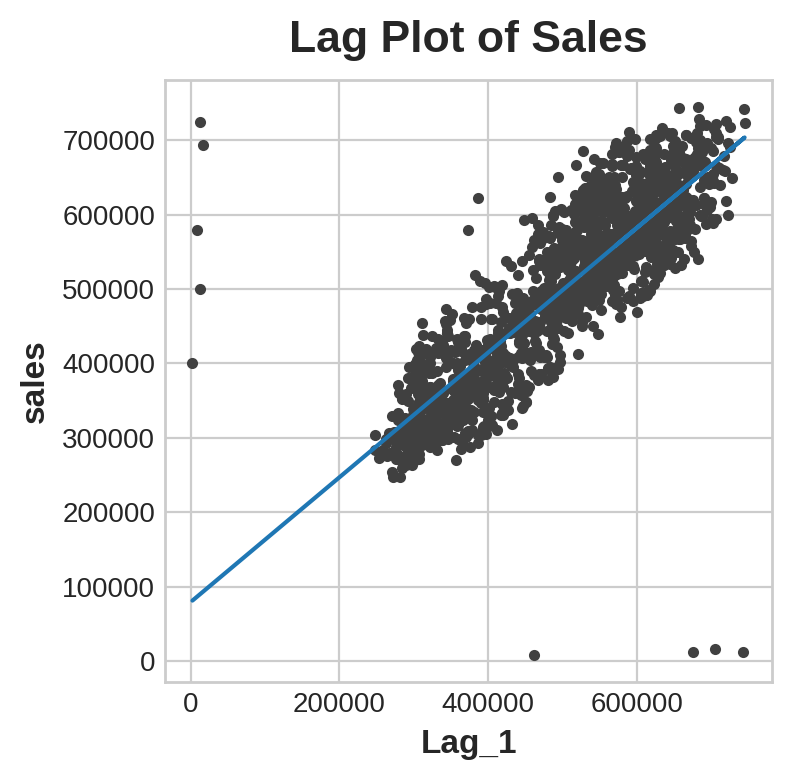

In [ ]:
fig, ax = plt.subplots()
ax.plot(X['sales_lag1'], y, '.', color='0.25')
ax.plot(X['sales_lag1'], y_pred)
ax.set_aspect('equal')
ax.set_ylabel('sales')
ax.set_xlabel('Lag_1')
ax.set_title('Lag Plot of Sales');

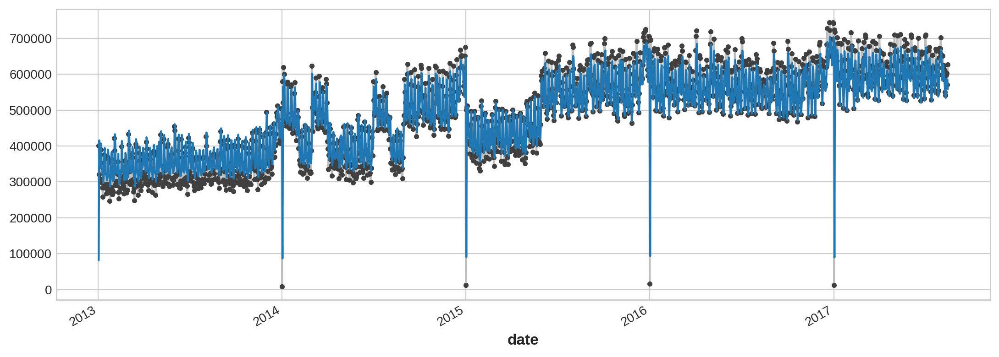

In [ ]:
ax = y.plot(**plot_params)
ax = y_pred.plot()

In [ ]:
plot_residuals(y, y_pred, 'Residuals of LinearRegression - lag features')

# SGDRegressor

In [ ]:
train_df.sales.describe()

,sales
count,2.970869e+06
mean,2.775347e+02
std,7.032099e+02
min,0.000000e+00
25%,0.000000e+00
50%,1.000000e+01
75%,1.840000e+02
max,5.506720e+03


In [ ]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(random_state=42)
%time sgd_reg.fit(X_train, y_train)

CPU times: user 19.7 s, sys: 29.5 ms, total: 19.7 s
Wall time: 23.3 s


SGDRegressor(random_state=42)

In [ ]:
y_train_pred = sgd_reg.predict(X_train)
y_test_pred = sgd_reg.predict(X_test)

In [ ]:
sgd_metrics = regression_metrics_df(y_train, y_train_pred, y_test, y_test_pred, 'SGDRegressor')
sgd_metrics

,Metric,Train Set,Test Set,Model
0,RMSE,422.82,424.34,SGDRegressor
1,MAPE (%),inf,inf,SGDRegressor
2,R2 Score,0.64,0.64,SGDRegressor
3,MAE,169.20,169.47,SGDRegressor
4,Relative Error to Mean (%),152.40,152.50,SGDRegressor


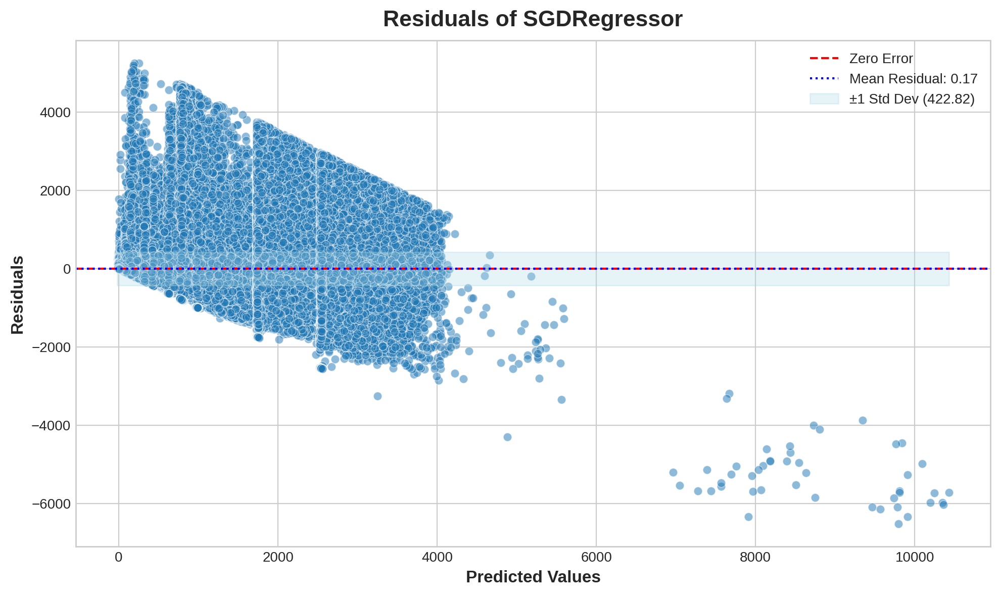

In [ ]:
plot_residuals_sns(y_train, y_train_pred, 'Residuals of SGDRegressor')

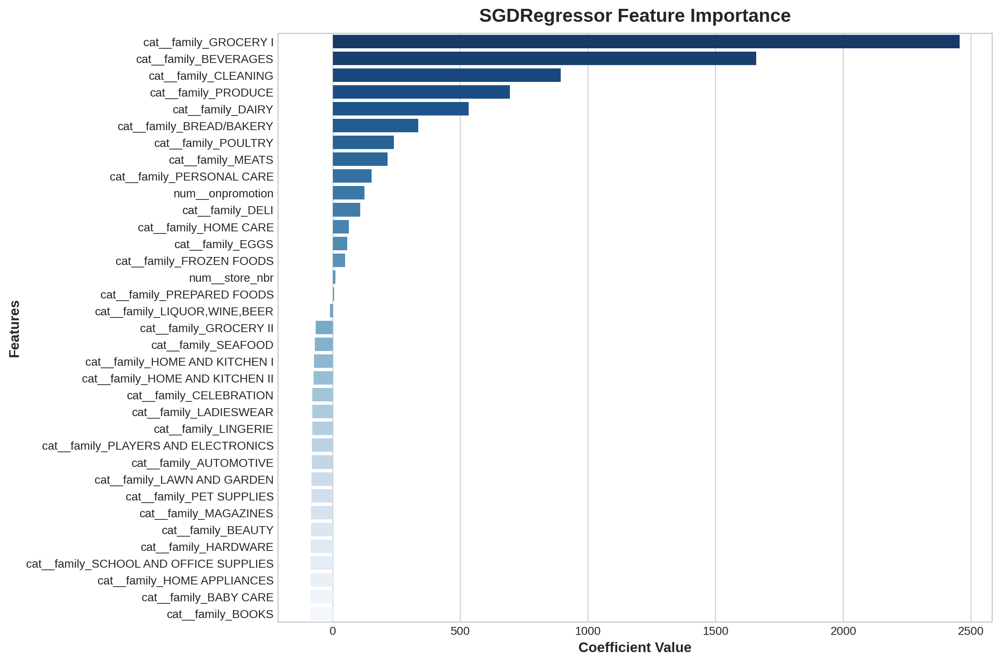

In [ ]:
plot_feature_importance(sgd_reg.coef_, preprocessor.get_feature_names_out(), 'SGDRegressor')

# LinearRegression

In [ ]:
lin_reg = LinearRegression()

%time lin_reg.fit(X_train, y_train)

CPU times: user 572 ms, sys: 581 ms, total: 1.15 s
Wall time: 1.07 s


LinearRegression()

In [ ]:
y_train_pred = lin_reg.predict(X_train)
y_test_pred = lin_reg.predict(X_test)

In [ ]:
lin_metrics = regression_metrics_df(y_train, y_train_pred, y_test, y_test_pred, 'LinearRegression')
lin_metrics

,Metric,Train Set,Test Set,Model
0,RMSE,422.78,424.30,LinearRegression
1,MAPE (%),inf,inf,LinearRegression
2,R2 Score,0.64,0.64,LinearRegression
3,MAE,170.99,171.25,LinearRegression
4,Relative Error to Mean (%),152.40,152.50,LinearRegression


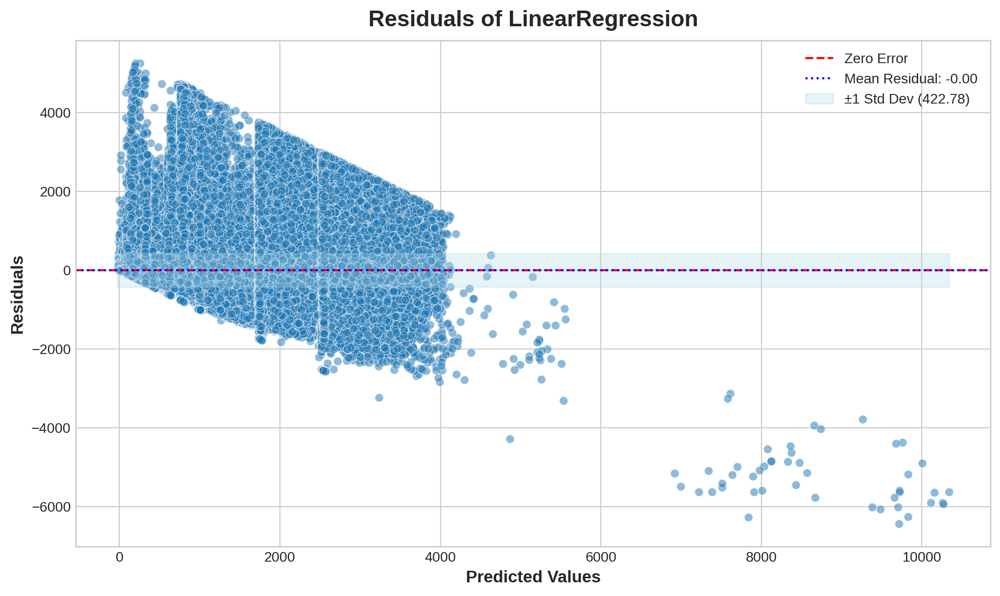

In [ ]:
plot_residuals_sns(y_train, y_train_pred, 'Residuals of LinearRegression')

# Trend


> The trend component of a time series represents a persistent, long-term change in the mean of the series. The trend is the slowest-moving part of a series, the part representing the largest time scale of importance. In a time series of product sales, an increasing trend might be the effect of a market expansion as more people become aware of the product year by year.

[Source](https://www.kaggle.com/code/ryanholbrook/trend)



## moving average plot

In [11]:
# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

In [20]:
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date = sales_per_date.set_index('date')
sales_per_date.head(2)

,sales
date,
2013-01-01,2511.618999
2013-01-02,401213.417944




> Let's make a moving average plot to see what kind of trend this series has. Since this series has daily observations, let's choose a window of 365 days to smooth over any short-term changes within the year.



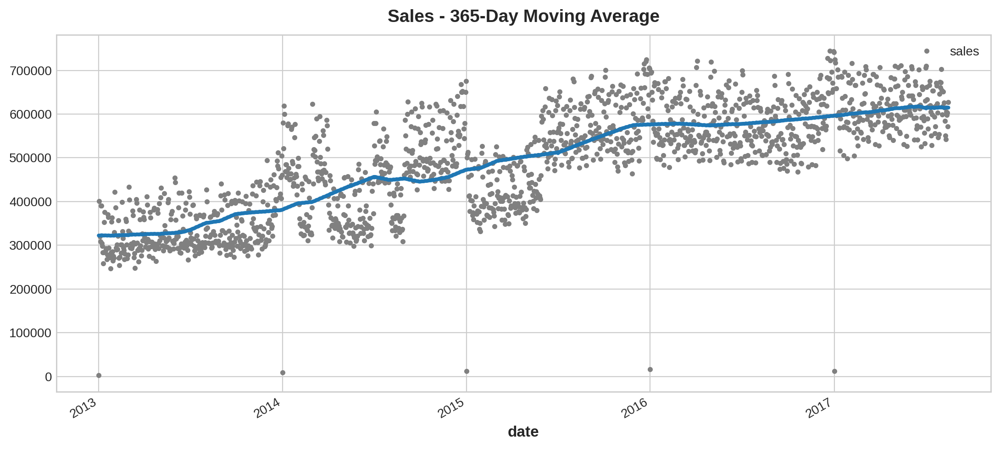

In [22]:
moving_average = sales_per_date.rolling(
    window=365,       # 365-day window
    center=True,      # puts the average at the center of the window
    min_periods=183,  # choose about half the window size
).mean()              # compute the mean (could also do median, std, min, max, ...)

ax = sales_per_date.plot(style=".", color="0.5")
moving_average.plot(
    ax=ax, linewidth=3, title="Sales - 365-Day Moving Average", legend=False,
);

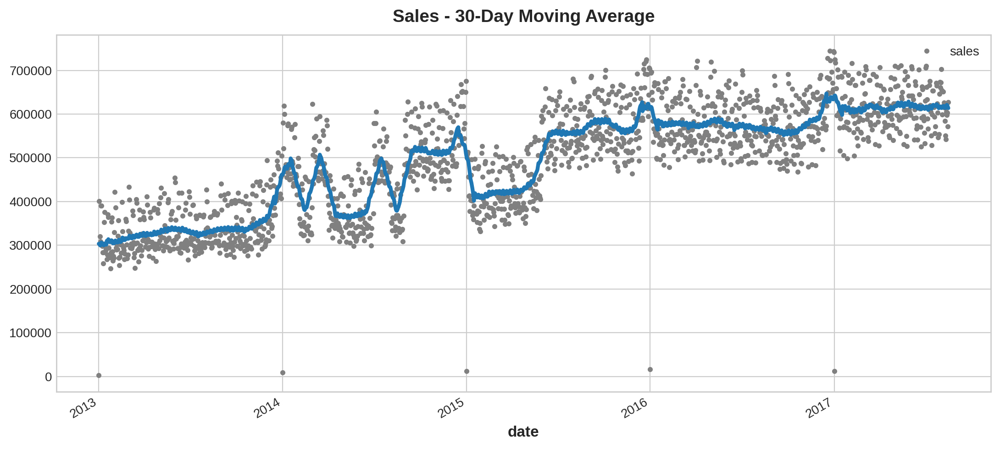

In [44]:
moving_average = sales_per_date.rolling(
    window=30,       # 30-day window
    center=True,      # puts the average at the center of the window
    min_periods=15,  # choose about half the window size
).mean()              # compute the mean (could also do median, std, min, max, ...)

ax = sales_per_date.plot(style=".", color="0.5")
moving_average.plot(
    ax=ax, linewidth=3, title="Sales - 30-Day Moving Average", legend=False,
);



> we engineered our time dummy in Pandas directly before. We can use a function from the statsmodels library called **DeterministicProcess**. Using this function will help us avoid some tricky failure cases that can arise with time series and linear regression. The order argument refers to polynomial order: 1 for linear, 2 for quadratic, 3 for cubic, and so on.



In [28]:
from statsmodels.tsa.deterministic import DeterministicProcess

dp = DeterministicProcess(
    index=sales_per_date.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=1,             # the time dummy (trend)
    drop=True,           # drop terms if necessary to avoid collinearity
)

In [27]:
dp

In [66]:
# `in_sample` creates features for the dates given in the `index` argument
X = dp.in_sample()

X.tail()

,const,trend
date,,
2017-08-11,1.0,1680.0
2017-08-12,1.0,1681.0
2017-08-13,1.0,1682.0
2017-08-14,1.0,1683.0
2017-08-15,1.0,1684.0




> We create our trend model basically as before, though note the addition of the fit_intercept=False argument.



In [32]:
from sklearn.linear_model import LinearRegression

y = sales_per_date['sales']  # the target

# The intercept is the same as the `const` feature from
# DeterministicProcess. LinearRegression behaves badly with duplicated
# features, so we need to be sure to exclude it here.
model = LinearRegression(fit_intercept=False)
model.fit(X, y)

LinearRegression(fit_intercept=False)

In [34]:
y_pred = pd.Series(model.predict(X), index=X.index)
y_pred.head()

,0
date,
2013-01-01,318689.027237
2013-01-02,318892.153084
2013-01-03,319095.278931
2013-01-04,319298.404777
2013-01-05,319501.530624


In [36]:
regression_metrics_df(y, y_pred, y, y_pred, 'LinearRegression - trend')

,Metric,Train Set,Test Set,Model
0,RMSE,74935.92,74935.92,LinearRegression - trend
1,MAPE (%),29.50,29.50,LinearRegression - trend
2,R2 Score,0.63,0.63,LinearRegression - trend
3,MAE,58993.05,58993.05,LinearRegression - trend
4,Relative Error to Mean (%),15.30,15.30,LinearRegression - trend


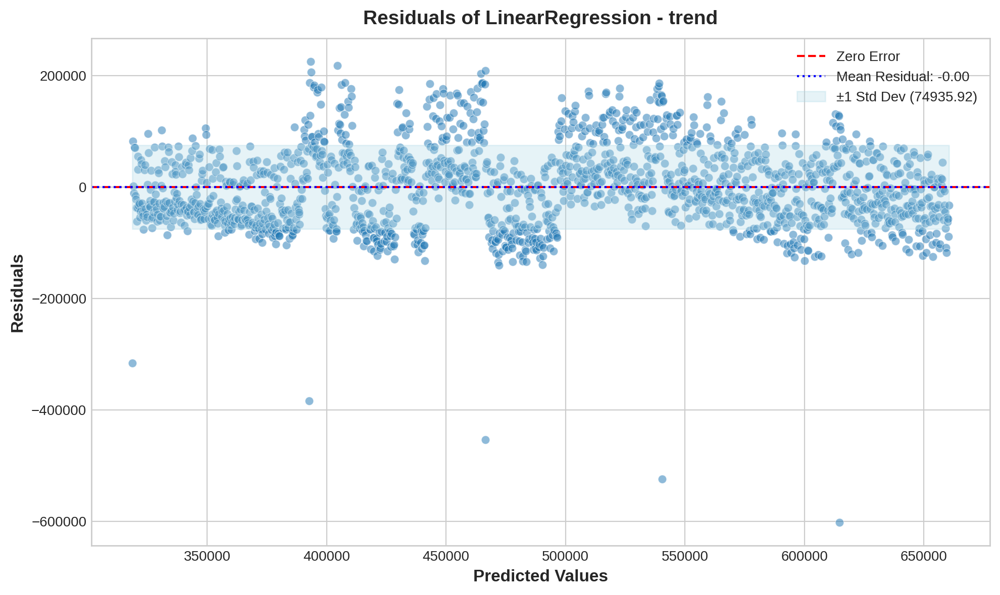

In [35]:
plot_residuals_sns(y, y_pred, 'Residuals of LinearRegression - trend')



> The trend discovered by our LinearRegression model is almost identical to the moving average plot, which suggests that a linear trend was the right decision in this case.



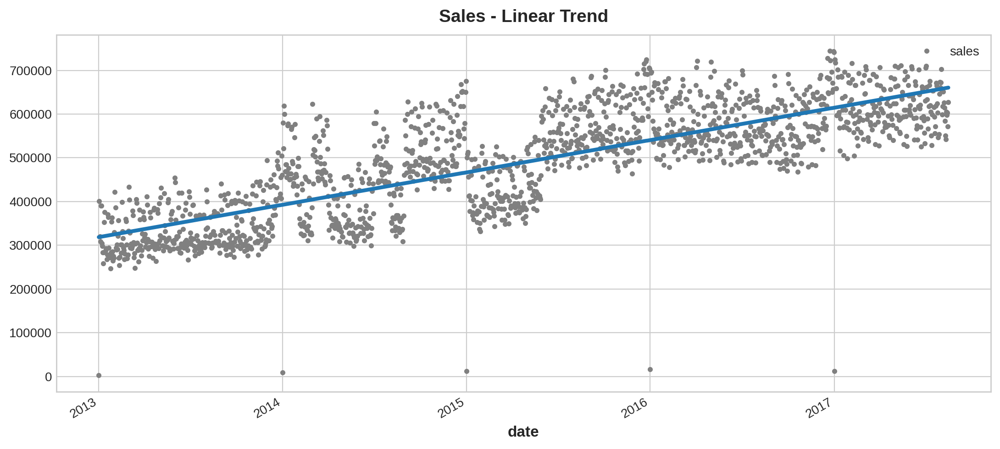

In [37]:
ax = sales_per_date.plot(style=".", color="0.5", title="Sales - Linear Trend")
_ = y_pred.plot(ax=ax, linewidth=3, label="Trend")



> To make a forecast, we apply our model to "out of sample" features. "Out of sample" refers to times outside of the observation period of the training data. Here's how we could make a 30-day forecast:



In [69]:
# Create the out-of-sample feature DataFrame
out_of_sample_df = dp.out_of_sample(steps=30)

# Generate a date range for the forecast period
start_date = X.index[-1] + pd.Timedelta(days=1)
date_range = pd.date_range(start=start_date, periods=30, freq='D')

# Assign this date range to the index of the out-of-sample DataFrame
out_of_sample_df.index = date_range
out_of_sample_df.head()

,const,trend
2017-08-16,1.0,1685.0
2017-08-17,1.0,1686.0
2017-08-18,1.0,1687.0
2017-08-19,1.0,1688.0
2017-08-20,1.0,1689.0


In [73]:
y_forecast = pd.Series(model.predict(out_of_sample_df), index=out_of_sample_df.index)

y_forecast.head()

,0
2017-08-16,660752.953008
2017-08-17,660956.078855
2017-08-18,661159.204702
2017-08-19,661362.330548
2017-08-20,661565.456395


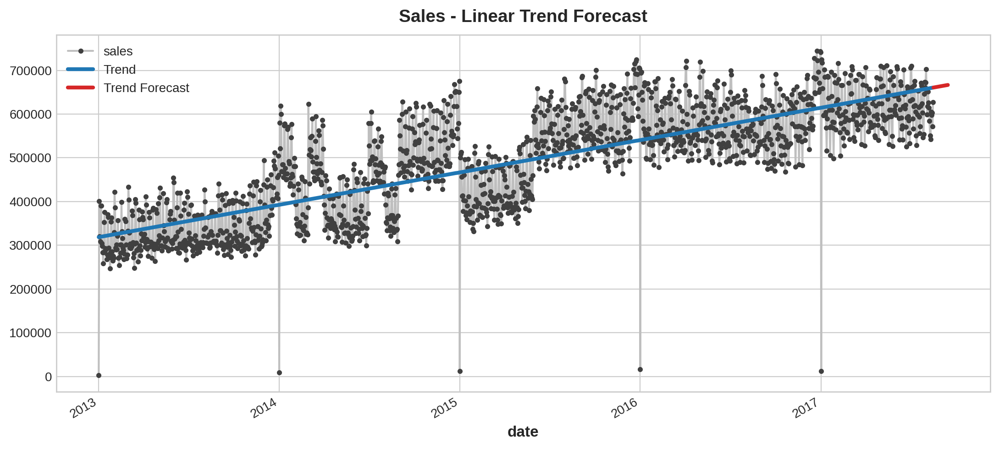

In [74]:
ax = sales_per_date["sales"].plot(title="Sales - Linear Trend Forecast", **plot_params)
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend")
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color="C3")
_ = ax.legend()

# Seasonality


> Just like we used a moving average plot to discover the trend in a series, we can use a seasonal plot to discover seasonal patterns.
>
> A seasonal plot shows segments of the time series plotted against some common period, the period being the "season" you want to observe.
>
> There are two kinds of features that model seasonality.
- The first kind, **indicators**, is best for a season with few observations, like a weekly season of daily observations.
- The second kind, **Fourier features**, is best for a season with many observations, like an annual season of daily observations.

[Source](https://www.kaggle.com/code/ryanholbrook/seasonality)




In [93]:
# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [80]:
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date = sales_per_date.set_index('date').to_period('D')
sales_per_date.head(2)

,sales
date,
2013-01-01,2511.618999
2013-01-02,401213.417944


In [89]:
X = sales_per_date.copy()

# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)

# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year

X.head()

,sales,day,week,dayofyear,year
date,,,,,
2013-01-01,2511.618999,1,1,1,2013
2013-01-02,401213.417944,2,1,2,2013
2013-01-03,320558.231124,3,1,3,2013
2013-01-04,308657.677093,4,1,4,2013
2013-01-05,390971.121229,5,1,5,2013


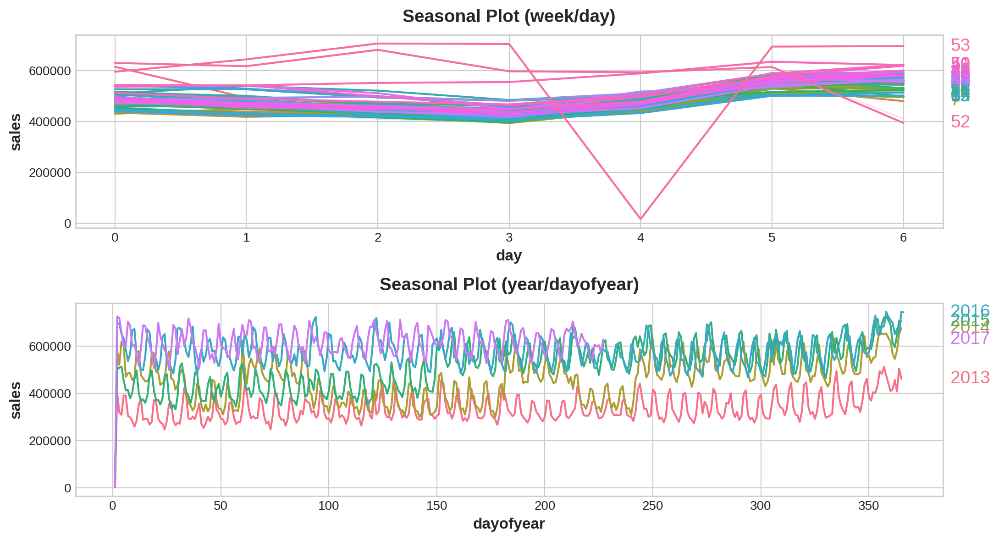

In [94]:
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(11, 6))
seasonal_plot(X, y="sales", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="sales", period="year", freq="dayofyear", ax=ax1);

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

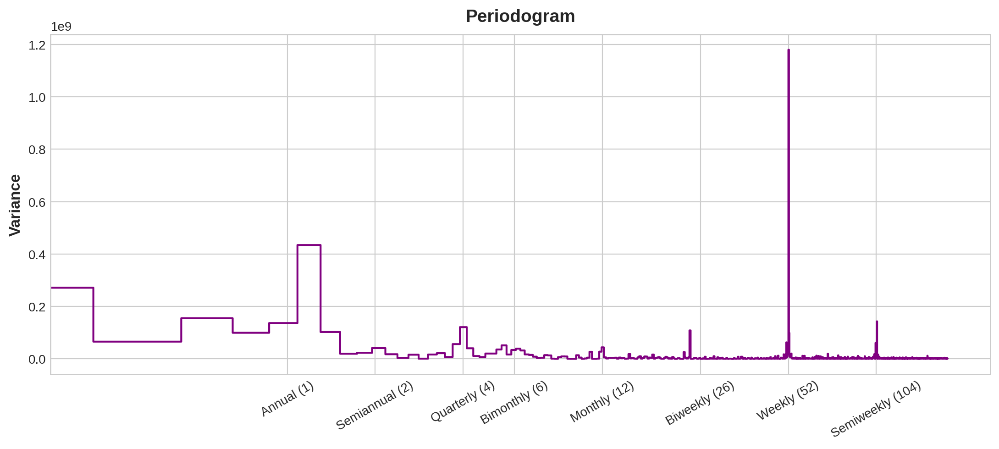

In [95]:
plot_periodogram(sales_per_date.sales)

- **Clear Peaks**: The periodogram displays clear peaks, notably at the "**Weekly (52)**" frequency, indicating that there's a significant amount of variance at this frequency. This suggests that the underlying time series data has a strong weekly component.

- **Smaller Peaks**: There are smaller peaks at **"Annual (1)" and "Semiannual (2)"** frequencies, indicating some level of seasonal or semi-annual patterns in the data. These peaks may represent yearly or bi-yearly trends or cycles in the data.

- **Flat Sections**: The sections of the plot between the major peaks are relatively flat, suggesting lower variance and potentially weaker periodic components at those frequencies.



> There is a strong weekly season and a weaker annual season. The weekly season we'll model with indicators and the annual season with Fourier features. From right to left, the periodogram falls off between Bimonthly (6) and Monthly (12), so let's use 10 Fourier pairs.



- **Weekly Seasonality with Indicators:**
Since the weekly seasonality is strong, you can model it using indicator (or dummy) variables. These variables would capture the weekly effect by assigning different values for different days of the week (or any other relevant sub-period within the week).
- **Annual Seasonality with Fourier Features:**
Fourier features are used to capture complex seasonal patterns, especially when the seasonality is not as simple as a weekly pattern. Since the annual seasonality is weaker but still present, using Fourier features is a suitable approach. Fourier series can model periodic functions by decomposing them into a sum of sine and cosine functions, which can capture the cyclical nature of the data.
- **Selecting the Number of Fourier Pairs:**
The periodogram's variance falls off between "Bimonthly (6)" and "Monthly (12)", suggesting that the complexity of the seasonality decreases as you move from shorter to longer periods. By choosing 10 Fourier pairs, you aim to capture enough of the annual seasonality without overfitting. This means you're using 10 sine and 10 cosine functions to approximate the annual seasonality.

In [97]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

In [98]:
fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=sales_per_date.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in sales_per_date.index

In [99]:
fourier

Fourier(freq=A-DEC, order=10) at 0x7848447f6860

In [102]:
dp

In [107]:
X.head(3)

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=A-DEC)","cos(1,freq=A-DEC)",...,"sin(6,freq=A-DEC)","cos(6,freq=A-DEC)","sin(7,freq=A-DEC)","cos(7,freq=A-DEC)","sin(8,freq=A-DEC)","cos(8,freq=A-DEC)","sin(9,freq=A-DEC)","cos(9,freq=A-DEC)","sin(10,freq=A-DEC)","cos(10,freq=A-DEC)"
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,...,0.103102,0.994671,0.120208,0.992749,0.137279,0.990532,0.154309,0.988023,0.171293,0.985220
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,...,0.205104,0.978740,0.238673,0.971100,0.271958,0.962309,0.304921,0.952378,0.337523,0.941317


In [104]:
X.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1684 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   const               1684 non-null   float64
 1   trend               1684 non-null   float64
 2   s(2,7)              1684 non-null   float64
 3   s(3,7)              1684 non-null   float64
 4   s(4,7)              1684 non-null   float64
 5   s(5,7)              1684 non-null   float64
 6   s(6,7)              1684 non-null   float64
 7   s(7,7)              1684 non-null   float64
 8   sin(1,freq=A-DEC)   1684 non-null   float64
 9   cos(1,freq=A-DEC)   1684 non-null   float64
 10  sin(2,freq=A-DEC)   1684 non-null   float64
 11  cos(2,freq=A-DEC)   1684 non-null   float64
 12  sin(3,freq=A-DEC)   1684 non-null   float64
 13  cos(3,freq=A-DEC)   1684 non-null   float64
 14  sin(4,freq=A-DEC)   1684 non-null   float64
 15  cos(4,freq=A-DEC)   1684 non-nu



> With our feature set created, we're ready to fit the model and make predictions. We'll add a** 90-day forecast** to see how our model extrapolates beyond the training data.



In [113]:
y = sales_per_date['sales']  # the target

model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_forecast = dp.out_of_sample(steps=90)
y_forecast = pd.Series(model.predict(X_forecast), index=X_forecast.index)

In [130]:
regression_metrics_df(y, y_pred, y, y_pred, 'LinearRegression - seasonality')

,Metric,Train Set,Test Set,Model
0,RMSE,69268.68,69268.68,LinearRegression - seasonality
1,MAPE (%),29.30,29.30,LinearRegression - seasonality
2,R2 Score,0.69,0.69,LinearRegression - seasonality
3,MAE,53372.56,53372.56,LinearRegression - seasonality
4,Relative Error to Mean (%),14.10,14.10,LinearRegression - seasonality


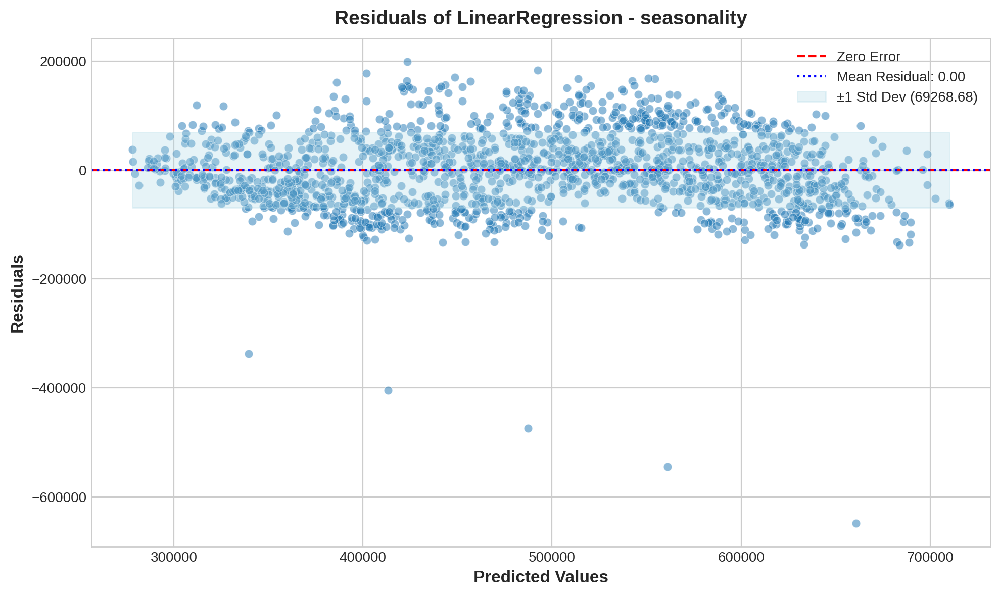

In [131]:
plot_residuals_sns(y, y_pred, 'Residuals of LinearRegression - seasonality')

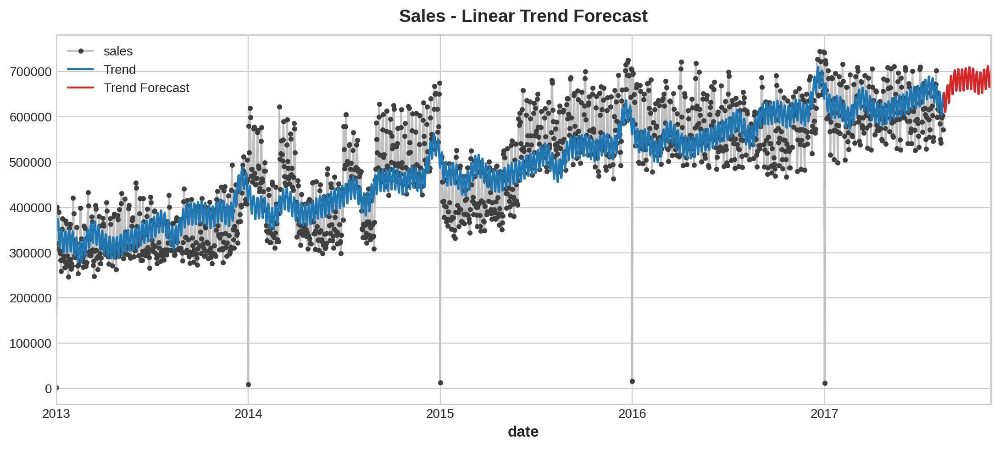

In [129]:
ax = y.plot(title="Sales - Linear Trend Forecast", **plot_params)
ax = y_pred.plot(ax=ax, label="Trend")
ax = y_forecast.plot(ax=ax, label="Trend Forecast", color="C3")
_ = ax.legend()

# Time Series as Features - Lags


>  - we saw properties of time series that were most easily modeled as **time dependent properties**, that is, with features we could **derive directly from the time index**.
>
> -  Some time series properties, however, can only be modeled as **serially dependent properties**, that is, using as features past values of the target series.
>
> - One especially common way for **serial dependence** to manifest is in **cycles**. Cycles are patterns of growth and decay in a time series associated with how the value in a series at one time depends on values at previous times, but not necessarily on the time step itself.
>
> - **Lagged Series**: To investigate possible serial dependence (like cycles) in a time series, we need to create "lagged" copies of the series. Lagging a time series means to shift its values forward one or more time steps, or equivalently, to shift the times in its index backward one or more steps.

[Source](https://www.kaggle.com/code/ryanholbrook/time-series-as-features)


In [156]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax


def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig

In [161]:
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date = sales_per_date.set_index('date').to_period('D')
sales_per_date.head(2)

,sales
date,
2013-01-01,2511.618999
2013-01-02,401213.417944


In [162]:
sales_per_date['sales_lag_1'] = sales_per_date['sales'].shift(1)
sales_per_date['sales_lag_2'] = sales_per_date['sales'].shift(2)
sales_per_date.head()

,sales,sales_lag_1,sales_lag_2
date,,,
2013-01-01,2511.618999,NaN,NaN
2013-01-02,401213.417944,2511.618999,NaN
2013-01-03,320558.231124,401213.417944,2511.618999
2013-01-04,308657.677093,320558.231124,401213.417944
2013-01-05,390971.121229,308657.677093,320558.231124


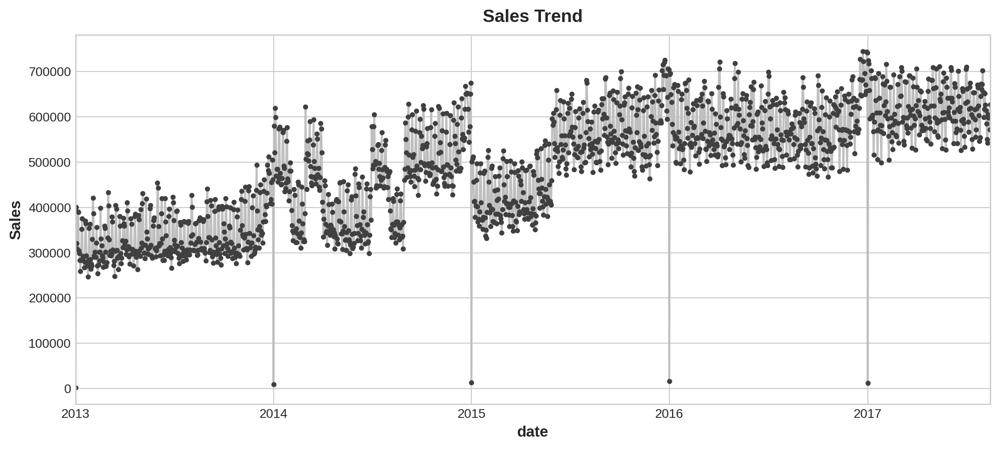

In [154]:
ax = sales_per_date.sales.plot(title='Sales Trend', **plot_params)
_ = ax.set(ylabel="Sales")

In [158]:
from statsmodels.graphics.tsaplots import plot_pacf
from scipy.signal import periodogram


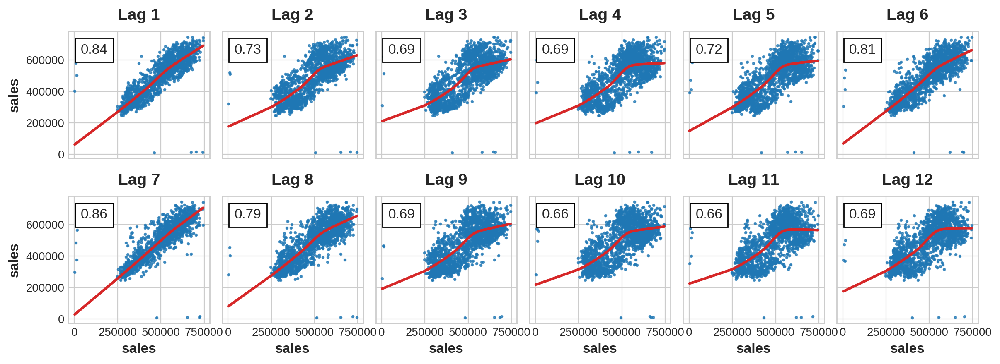

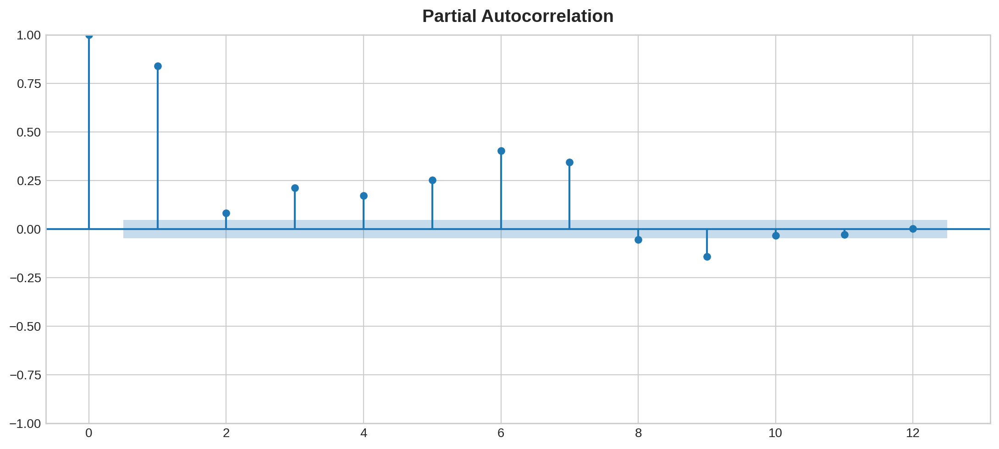

In [159]:
_ = plot_lags(sales_per_date.sales, lags=12, nrows=2)
_ = plot_pacf(sales_per_date.sales, lags=12)

> The lag plots indicate that the relationship of sales to its lags is mostly linear, while the **partial autocorrelations** suggest the dependence can be captured using lags 1, 2, 3,.. to 9. We can lag a time series in Pandas with the shift method. For this problem, we'll fill in the missing values the lagging creates with 0.0.



In [160]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

In [166]:
X = make_lags(sales_per_date.sales, lags=9)
X = X.fillna(0.0)
X.head()

,y_lag_1,y_lag_2,y_lag_3,y_lag_4,y_lag_5,y_lag_6,y_lag_7,y_lag_8,y_lag_9
date,,,,,,,,,
2013-01-01,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2013-01-02,2511.618999,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2013-01-03,401213.417944,2511.618999,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
2013-01-04,320558.231124,401213.417944,2511.618999,0.000000,0.0,0.0,0.0,0.0,0.0
2013-01-05,308657.677093,320558.231124,401213.417944,2511.618999,0.0,0.0,0.0,0.0,0.0


In [167]:
# Create target series and data splits
y = sales_per_date.sales.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=60, shuffle=False)

# Fit and predict
model = LinearRegression()  # `fit_intercept=True` since we didn't use DeterministicProcess
model.fit(X_train, y_train)

y_pred = pd.Series(model.predict(X_train), index=y_train.index)
y_fore = pd.Series(model.predict(X_test), index=y_test.index)

In [168]:
regression_metrics_df(y_train, y_pred, y_test, y_fore, 'LinearRegression - lags')

,Metric,Train Set,Test Set,Model
0,RMSE,53688.86,29899.98,LinearRegression - lags
1,MAPE (%),19.40,3.80,LinearRegression - lags
2,R2 Score,0.81,0.59,LinearRegression - lags
3,MAE,32163.83,23798.08,LinearRegression - lags
4,Relative Error to Mean (%),11.10,4.90,LinearRegression - lags


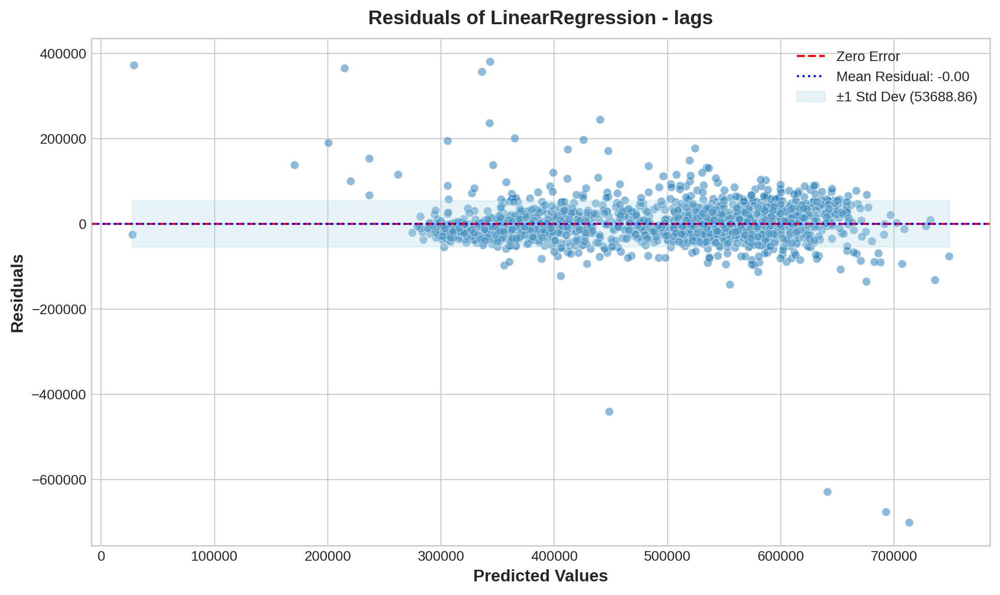

In [169]:
plot_residuals_sns(y_train, y_pred, 'Residuals of LinearRegression - lags')

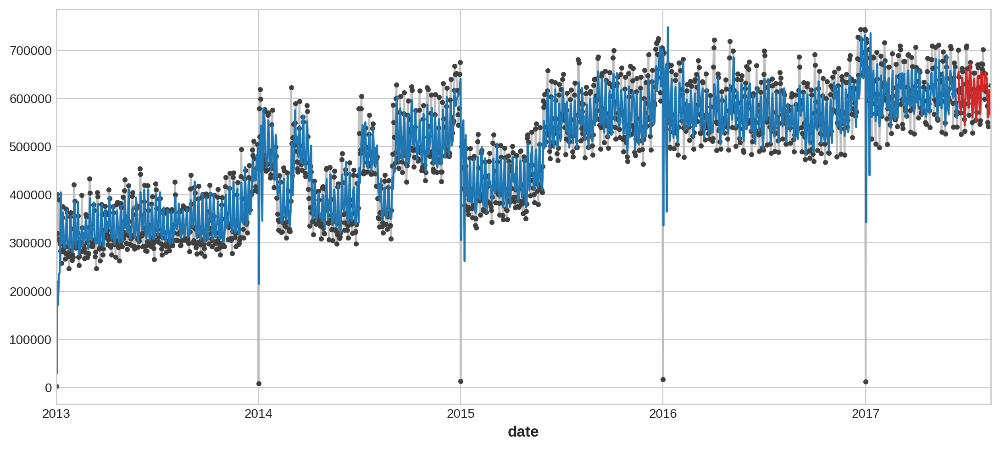

In [170]:
ax = y_train.plot(**plot_params)
ax = y_test.plot(**plot_params)
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')

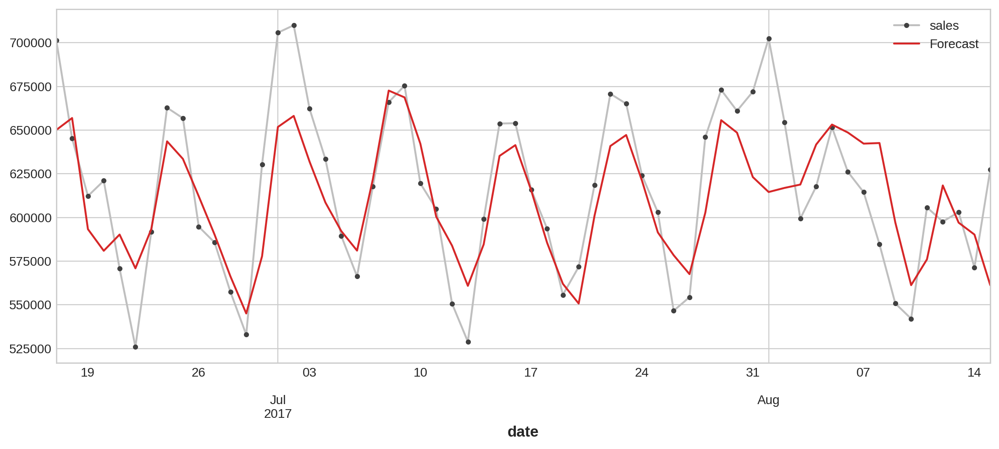

In [173]:
ax = y_test.plot(**plot_params)
_ = y_fore.plot(ax=ax, color='C3', label='Forecast')
_ = ax.legend()

# Hybrid Models


> - **Linear regression** excels at extrapolating trends, but can't learn interactions. **XGBoost** excels at learning interactions, but can't extrapolate trends.Here,we'll create "hybrid" forecasters that combine complementary learning algorithms and let the strengths of one make up for the weakness of the other.
> - So that we can design effective hybrids, we need a better understanding of how time series are constructed. We've looked up to now **three patterns of dependence**: trend, seasons, and cycles. Many time series can be closely described by an additive model of just these three components plus some essentially unpredictable, entirely random error:
>
>  `series = trend + seasons + cycles + error`
> - There are generally two ways a regression algorithm can make predictions: either by transforming the features or by transforming the target.
 - **Feature-transforming algorithms** learn some mathematical function that takes features as an input and then combines and transforms them to produce an output that matches the target values in the training set. Linear regression and neural nets are of this kind.
 - **Target-transforming algorithms** use the features to group the target values in the training set and make predictions by averaging values in a group; a set of feature just indicates which group to average. Decision trees and nearest neighbors are of this kind.

[Source](https://www.kaggle.com/code/ryanholbrook/hybrid-models)

In [175]:
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date = sales_per_date.set_index('date').to_period('D')
sales_per_date.head(2)

,sales
date,
2013-01-01,2511.618999
2013-01-02,401213.417944


In [176]:
y = sales_per_date.copy()

# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)

X = dp.in_sample() # features for the training data

In [178]:
X.head(2)

,const,trend,trend_squared
date,,,
2013-01-01,1.0,1.0,1.0
2013-01-02,1.0,2.0,4.0


In [180]:
# Test on the last 300 days. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(
    y.index, test_size=300, shuffle=False,
)
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]


In [182]:
# Fit trend model
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(
    model.predict(X_train),
    index=y_train.index,
    columns=y_train.columns,
)
y_pred = pd.DataFrame(
    model.predict(X_test),
    index=y_test.index,
    columns=y_test.columns,
)


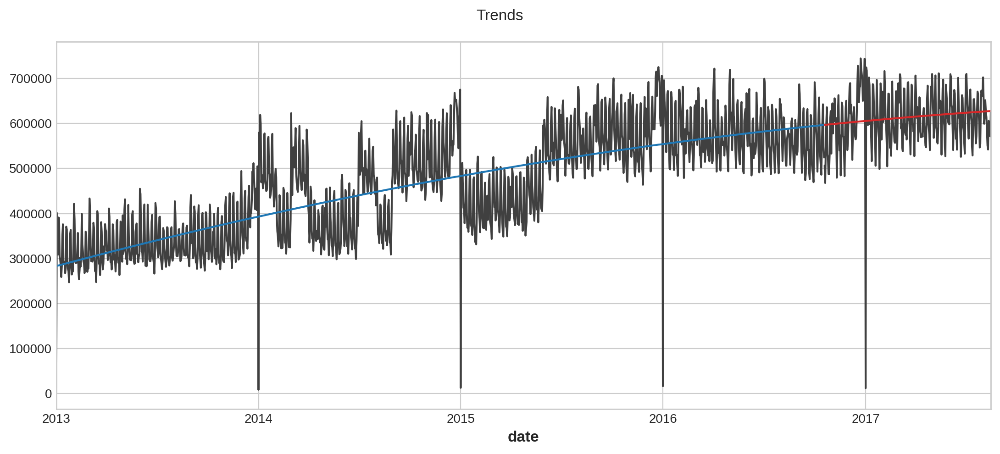

In [187]:
# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")

## sales_per_month
let's look at sales over months to be able to see if the hybrid model learns the monthly pattern in the data.

In [215]:
# Group by date to get the total sales per month
sales_per_date = train_df.groupby('date')['sales'].sum().reset_index()
sales_per_date = sales_per_date.set_index('date').to_period('M')
sales_per_month = sales_per_date.groupby('date')['sales'].sum().reset_index().set_index('date')
sales_per_month.head(3)

,sales
date,
2013-01,9.313682e+06
2013-02,8.693610e+06
2013-03,1.007009e+07


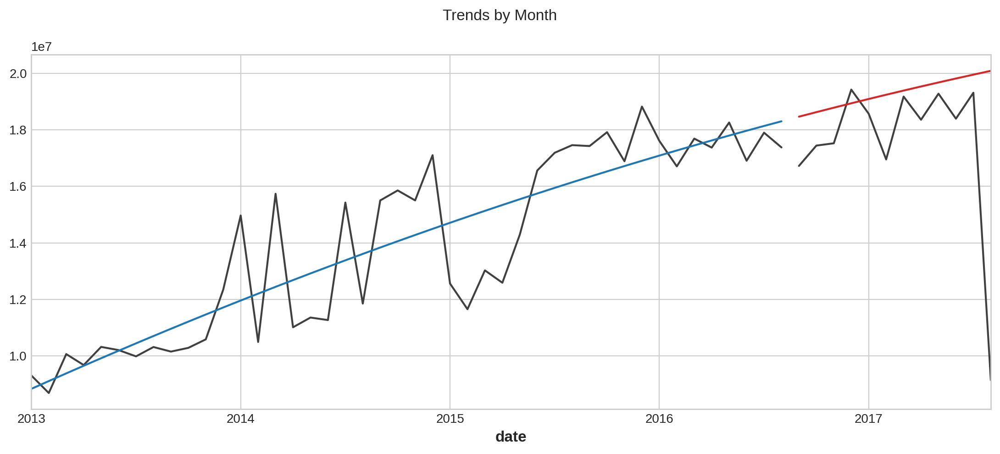

In [198]:
y = sales_per_month.copy()

# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)
X = dp.in_sample()  # features for the training data

# Test on the years 2016-2019. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(
    y.index, test_size=12, shuffle=False,
)
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]

# Fit trend model
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(
    model.predict(X_train),
    index=y_train.index,
    columns=y_train.columns,
)
y_pred = pd.DataFrame(
    model.predict(X_test),
    index=y_test.index,
    columns=y_test.columns,
)

# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends by Month")

## Data processed and model

In [217]:
store_sales = pd.read_csv(
    '/kaggle/input/store-sales-time-series-forecasting/train.csv',
    usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)

store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()

family_sales = (
    store_sales
    .groupby(['family', 'date'])
    .mean()
    .unstack('family')
    .loc['2017']
)

In [219]:
store_sales.head()

sales  onpromotion
store_nbr family     date                          
1         AUTOMOTIVE 2013-01-01    0.0            0
                     2013-01-02    2.0            0
                     2013-01-03    3.0            0
                     2013-01-04    3.0            0
                     2013-01-05    5.0            0

In [220]:
store_sales.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3000888 entries, ('1', 'AUTOMOTIVE', Period('2013-01-01', 'D')) to ('9', 'SEAFOOD', Period('2017-08-15', 'D'))
Data columns (total 2 columns):
 #   Column       Dtype  
---  ------       -----  
 0   sales        float32
 1   onpromotion  int64  
dtypes: float32(1), int64(1)
memory usage: 45.9 MB


In [221]:
family_sales.head()

sales                                              \
family     AUTOMOTIVE BABY CARE     BEAUTY    BEVERAGES     BOOKS   
date                                                                
2017-01-01   0.092593  0.037037   0.055556    74.222221  0.000000   
2017-01-02  11.481482  0.259259  11.648149  6208.055664  0.481481   
2017-01-03   8.296296  0.296296   7.185185  4507.814941  0.814815   
2017-01-04   6.833333  0.333333   6.888889  3911.833252  0.759259   
2017-01-05   6.333333  0.351852   5.925926  3258.796387  0.407407   

                                                                           \
family     BREAD/BAKERY CELEBRATION     CLEANING        DAIRY        DELI   
date                                                                        
2017-01-01     9.084685    0.129630     7.500000    11.518518    3.629167   
2017-01-02   844.836304   14.203704  2233.648193  1545.000000  539.114807   
2017-01-03   665.124146   10.629630  1711.907349  1204.203735  404.300049   
2017-01-04   594.160645   11.185185  1508.036987  1107.796265  309.397675   
2017-01-05   495.511597   12.444445  1241.833374   829.277771  260.776489   

            ... onpromotion                                       \
family      ...   MAGAZINES     MEATS PERSONAL CARE PET SUPPLIES   
date        ...                                                    
2017-01-01  ...         0.0  0.018519      0.111111     0.018519   
2017-01-02  ...         0.0  0.462963     10.592593     0.537037   
2017-01-03  ...         0.0  0.481481      9.722222     0.444444   
2017-01-04  ...         0.0  0.370370     12.037037     0.444444   
2017-01-05  ...         0.0  8.981481      5.666667     0.000000   

                                                                         \
family     PLAYERS AND ELECTRONICS   POULTRY PREPARED FOODS     PRODUCE   
date                                                                      
2017-01-01                     0.0  0.000000       0.037037    0.129630   
2017-01-02                     0.0  0.259259       1.166667    5.629630   
2017-01-03                     0.0  0.388889       1.351852   56.296296   
2017-01-04                     0.0  0.296296       5.444444  101.277778   
2017-01-05                     0.0  0.296296       0.907407    5.018519   

                                                 
family     SCHOOL AND OFFICE SUPPLIES   SEAFOOD  
date                                             
2017-01-01                        0.0  0.000000  
2017-01-02                        0.0  0.407407  
2017-01-03                        0.0  0.407407  
2017-01-04                        0.0  0.333333  
2017-01-05                        0.0  0.444444  

[5 rows x 66 columns]

In [228]:
# You'll add fit and predict methods to this minimal class
class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method

In [229]:
def fit(self, X_1, X_2, y):
    # Train model_1
    self.model_1.fit(X_1, y)

    # Make predictions
    y_fit = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index, columns=y.columns,
    )

    # Compute residuals
    y_resid = y - y_fit
    y_resid = y_resid.stack().squeeze() # wide to long

    # Train model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # Save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid


# Add method to class
BoostedHybrid.fit = fit

In [234]:
def predict(self, X_1, X_2):
    # Predict with model_1
    y_pred = pd.DataFrame(
        self.model_1.predict(X_1),
        index=X_1.index, columns=self.y_columns,
    )
    y_pred = y_pred.stack().squeeze()  # wide to long

    # Add model_2 predictions to model_1 predictions
    y_pred += self.model_2.predict(X_2)

    return y_pred.unstack()


# Add method to class
BoostedHybrid.predict = predict

In [235]:
BoostedHybrid

__main__.BoostedHybrid

In [237]:
# help(BoostedHybrid)

In [240]:
from sklearn.preprocessing import LabelEncoder

In [241]:
# Target series
y = family_sales.loc[:, 'sales']


# X_1: Features for Linear Regression
dp = DeterministicProcess(index=y.index, order=1)
X_1 = dp.in_sample()

In [255]:
X_1.head()

,trend
date,
2017-01-01,1.0
2017-01-02,2.0
2017-01-03,3.0
2017-01-04,4.0
2017-01-05,5.0


In [249]:
# X_2: Features for XGBoost
X_2 = family_sales.drop('sales', axis=1).stack()  # onpromotion feature

# Label encoding for 'family'
le = LabelEncoder()  # from sklearn.preprocessing
X_2 = X_2.reset_index('family')
X_2['family'] = le.fit_transform(X_2['family'])

# Label encoding for seasonality
X_2["day"] = X_2.index.day  # values are day of the month

In [253]:
le.classes_

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [254]:
X_2.head()

,family,onpromotion,day
date,,,
2017-01-01,0,0.000000,1
2017-01-01,1,0.000000,1
2017-01-01,2,0.000000,1
2017-01-01,3,0.703704,1
2017-01-01,4,0.000000,1


In [256]:
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor

# Create model
model = BoostedHybrid(
    model_1=LinearRegression(),
    model_2=XGBRegressor(),
)
model.fit(X_1, X_2, y)

y_pred = model.predict(X_1, X_2)
y_pred = y_pred.clip(0.0) # make negatives = 0

In [266]:
y_pred.head(2)

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,2.762228,-2.646050,1.356903,566.785041,-28.998545,374.722380,15.919142,455.915641,259.726748,102.375535,...,-3.219026,285.403693,210.784359,-7.641238,7.992772,320.553240,83.977283,543.734480,-6.392733,18.280639
2017-01-02,15.206407,-0.367802,6.148776,6009.657027,7.596949,679.859304,22.630869,1746.993153,1467.862336,443.049239,...,7.617947,384.653236,527.697623,23.383267,18.886403,446.517319,135.661303,3151.384796,-3.418090,29.211314


In [264]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

rmse = mean_squared_error(y, y_pred, squared=False)
mape = mean_absolute_percentage_error(y, y_pred)
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2%}")

RMSE: 57.47
MAPE: 25148930110904864.00%


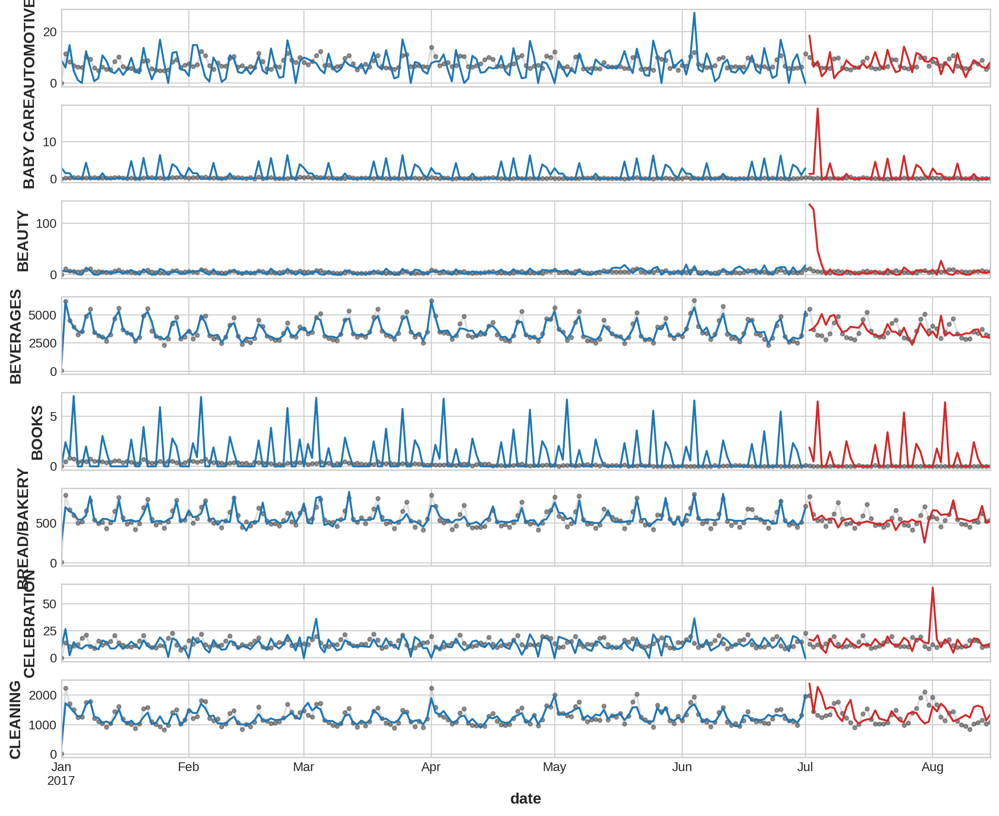

In [276]:
y_train, y_valid = y[:"2017-07-01"], y["2017-07-02":]
X1_train, X1_valid = X_1[: "2017-07-01"], X_1["2017-07-02" :]
X2_train, X2_valid = X_2.loc[:"2017-07-01"], X_2.loc["2017-07-02":]

# Some of the algorithms above do best with certain kinds of
# preprocessing on the features (like standardization), but this is
# just a demo.
model.fit(X1_train, X2_train, y_train)
y_fit = model.predict(X1_train, X2_train).clip(0.0)
y_pred = model.predict(X1_valid, X2_valid).clip(0.0)

families = y.columns[0:8]
axs = y.loc(axis=1)[families].plot(
    subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5,
)
_ = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_ = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

# Forecasting With Machine Learning

In [284]:
def make_multistep_target(ts, steps, reverse=False):
    shifts = reversed(range(steps)) if reverse else range(steps)
    return pd.concat({f'y_step_{i + 1}': ts.shift(-i) for i in shifts}, axis=1)

def plot_multistep(y, every=1, ax=None, palette_kwargs=None):
    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds))
        preds.plot(ax=ax)
    return ax

In [285]:
y = family_sales.loc[:, 'sales']

X = make_lags(y, lags=4).dropna()

y = make_multistep_target(y, steps=16).dropna()

y, X = y.align(X, join='inner', axis=0)

In [287]:
X.head(2)

y_lag_1                                                          \
family     AUTOMOTIVE BABY CARE    BEAUTY    BEVERAGES     BOOKS BREAD/BAKERY   
date                                                                            
2017-01-05   6.833333  0.333333  6.888889  3911.833252  0.759259   594.160645   
2017-01-06   6.333333  0.351852  5.925926  3258.796387  0.407407   495.511597   

                                                              ...   y_lag_4  \
family     CELEBRATION     CLEANING        DAIRY        DELI  ... MAGAZINES   
date                                                          ...             
2017-01-05   11.185185  1508.036987  1107.796265  309.397675  ...  0.074074   
2017-01-06   12.444445  1241.833374   829.277771  260.776489  ...  7.777778   

                                                                           \
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2017-01-05    5.013166      2.629630     0.074074                0.222222   
2017-01-06  488.522308    714.370361    12.814815               22.777779   

                                                                               \
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2017-01-05    2.855537       1.040722    31.163778                   0.000000   
2017-01-06  581.413147     153.555542  3409.500488                   2.925926   

                       
family        SEAFOOD  
date                   
2017-01-05   0.259259  
2017-01-06  33.581944  

[2 rows x 132 columns]

In [290]:
y.head(2)

y_step_1                                                          \
family     AUTOMOTIVE BABY CARE    BEAUTY    BEVERAGES     BOOKS BREAD/BAKERY   
date                                                                            
2017-01-05   6.333333  0.351852  5.925926  3258.796387  0.407407   495.511597   
2017-01-06   6.018518  0.277778  6.518518  3507.277832  0.537037   513.873291   

                                                             ...  y_step_16  \
family     CELEBRATION     CLEANING       DAIRY        DELI  ...  MAGAZINES   
date                                                         ...              
2017-01-05   12.444445  1241.833374  829.277771  260.776489  ...   6.537037   
2017-01-06   18.333334  1257.611084  864.333313  317.622406  ...  10.444445   

                                                                           \
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2017-01-05  512.165527    233.611115     6.444445                8.648149   
2017-01-06  402.395264    420.944458    11.314815               16.148148   

                                                                               \
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2017-01-05  513.483887     106.494171  2006.322021                   0.944444   
2017-01-06  489.485870     143.066299  2849.252930                   1.944444   

                       
family        SEAFOOD  
date                   
2017-01-05  25.899963  
2017-01-06  26.443592  

[2 rows x 528 columns]

In [291]:
le = LabelEncoder()
X = (X
    .stack('family')  # wide to long
    .reset_index('family')  # convert index to column
    .assign(family=lambda x: le.fit_transform(x.family))  # label encode
)
y = y.stack('family')  # wide to long

display(y)

y_step_1     y_step_2     y_step_3  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.333333     6.018518    10.259259   
           BABY CARE                      0.351852     0.277778     0.259259   
           BEAUTY                         5.925926     6.518518    10.037037   
           BEVERAGES                   3258.796387  3507.277832  4848.518555   
           BOOKS                          0.407407     0.537037     0.481481   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      364.955658   403.601349   377.313995   
           PREPARED FOODS                84.698647    87.836800    88.735970   
           PRODUCE                     2257.140625  2609.180176  3122.895752   
           SCHOOL AND OFFICE SUPPLIES    30.111111    49.333332    57.481480   
           SEAFOOD                       20.488333    20.346851    20.801037   

                                          y_step_4     y_step_5     y_step_6  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     9.388889     5.944445     4.777778   
           BABY CARE                      0.240741     0.444444     0.240741   
           BEAUTY                        11.611111     5.648148     6.500000   
           BEVERAGES                   5503.647949  3448.203613  3171.740723   
           BOOKS                          0.722222     0.500000     0.518519   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      316.436096   533.497009   416.454041   
           PREPARED FOODS                77.172997    91.886765   100.384964   
           PRODUCE                     1792.220947  2079.319336  2418.970215   
           SCHOOL AND OFFICE SUPPLIES    51.907406    63.222221    85.203705   
           SEAFOOD                       17.116297    25.553965    24.209518   

                                          y_step_7     y_step_8     y_step_9  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     6.314815     5.388889     5.240741   
           BABY CARE                      0.277778     0.296296     0.296296   
           BEAUTY                         5.277778     4.370370     4.703704   
           BEVERAGES                   3046.870361  2693.722168  3226.037109   
           BOOKS                          0.481481     0.388889     0.444444   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      464.596558   344.051758   313.780884   
           PREPARED FOODS               102.248146    86.627441    77.344131   
           PRODUCE                     2675.105957  2111.133301  2168.535400   
           SCHOOL AND OFFICE SUPPLIES   100.277779    64.407410    59.759258   
           SEAFOOD                       23.512852    18.419851    18.481131   

                                         y_step_10    y_step_11    y_step_12  \
date       family                                                              
2017-01-05 AUTOMOTIVE                     8.500000    10.259259     6.407407   
           BABY CARE                      0.388889     0.425926     0.314815   
           BEAUTY                         7.777778     9.037037     5.648148   
           BEVERAGES                   4667.296387  5580.611328  3700.370361   
           BOOKS                          0.574074     0.555556     0.388889   
...                                            ...          ...          ...   
2017-07-31 POULTRY                      305.270233   278.819885   468.857391   
           PREPARED FOODS                84.796539    78.791443    96.286926   
           PRODUCE                     2663.076416  1670.264893  2198.854492   
           SCHOOL AND OFFICE SUPPLIES  

In [292]:
from sklearn.multioutput import RegressorChain

model = RegressorChain(base_estimator=XGBRegressor())

In [293]:
model.fit(X, y)

y_pred = pd.DataFrame(
    model.predict(X),
    index=y.index,
    columns=y.columns,
).clip(0.0)

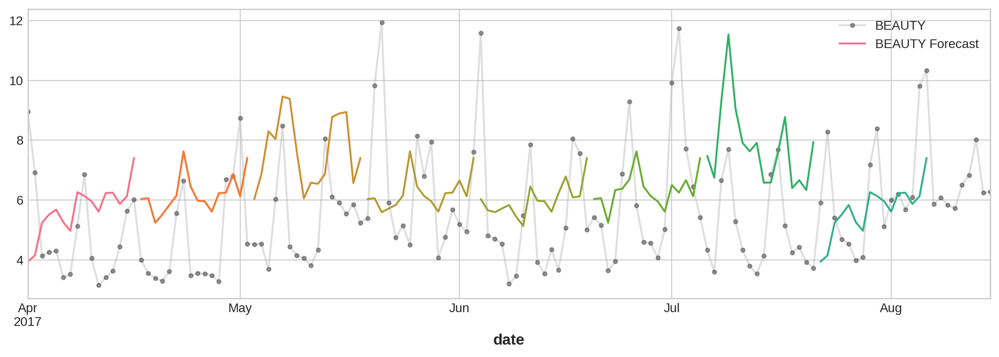

In [295]:
FAMILY = 'BEAUTY'
START = '2017-04-01'
EVERY = 16

y_pred_ = y_pred.xs(FAMILY, level='family', axis=0).loc[START:]
y_ = family_sales.loc[START:, 'sales'].loc[:, FAMILY]

fig, ax = plt.subplots(1, 1, figsize=(11, 4))
ax = y_.plot(**plot_params, ax=ax, alpha=0.5)
ax = plot_multistep(y_pred_, ax=ax, every=EVERY)
_ = ax.legend([FAMILY, FAMILY + ' Forecast'])

# References
- https://www.kaggle.com/learn/time-series